<h1 align="center"> Image Captioning With Attention</h1>

In this notebook you will teach network to use attention during captioning images.

Here is what we need to do:
1. Take pretrained VGG19 to build feature vectors for positions of images.
2. Stack LSTM with attention on top of that.
3. Train the model, draw attention maps.

This assignment is based on Alexander Panin's captioning assignment (https://github.com/yandexdataschool/Practical_DL/blob/spring2019/homework04/homework04_basic_part2_image_captioning.ipynb) and on the paper "Show, Attend and Tell" (https://arxiv.org/abs/1502.03044).

https://github.com/sgrvinod/a-PyTorch-Tutorial-to-Image-Captioning

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [3]:
import json
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import tqdm
import h5py
# you may need to install h5py, tqdm
#!pip install h5py tqdm
import sys
!{sys.executable} -m pip install h5py tqdm

## Data structure

To save your time, we've already vectorized all MSCOCO17 images with a pre-trained VGG19 network from [torchvision](https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py).

The whole process takes anywhere between a day on CPU and 30min on 1x GeForce GTX 1060. If you want to play with that yourself, [you're welcome](https://github.com/nadiinchi/dl_labs/blob/master/ht_attention_preprocess_data.ipynb).

Please either download data from [here](https://yadi.sk/d/KGh1SngBWH4stg) or generate it manually using the above script.

In [4]:
f = h5py.File('/content/drive/MyDrive/Image2caption/img_codes.hdf5', 'r')
img_codes = f['data']
captions = json.load(open('/content/drive/MyDrive/Image2caption/captions_tokenized.json'))

512x9x9 - feature maps at some layer of pretrained conv networks

In [5]:
print("Each image code is a 512x9x9-unit tensor [ shape: %s x %s ]" % (str(len(img_codes)), str(img_codes[0].shape)))
print(img_codes[0][:3].round(2), end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 512x9x9-unit tensor [ shape: 118287 x (512, 9, 9) ]
[[[0.   0.   0.   0.   0.07 0.69 0.   0.   0.  ]
  [0.   0.24 0.   0.   0.63 1.94 1.21 0.72 0.46]
  [0.77 0.76 0.   0.   0.   0.88 1.65 2.37 1.14]
  [0.21 0.   0.   0.   2.8  3.3  2.93 6.29 3.48]
  [0.   0.   0.   0.   3.29 3.81 2.24 2.76 0.01]
  [0.   0.   0.   1.18 0.32 0.08 0.   0.   0.  ]
  [1.02 1.76 0.89 1.77 0.   0.   0.   0.   0.  ]
  [0.   1.36 0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.09 0.3  0.  ]]

 [[0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.17 0.   0.   0.   0.   0.  ]
  [0.   0.95 0.   0.   0.   0.   0.   0.   0.  ]
  [0.34 1.5  0.   0.   0.36 0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.23 0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.52 0.   0.   0.  ]
  [0.   0.34 0.   0.   0.   0.   0.86 0.34 0.  ]
  [0.   0.47 0.26 0.41 0.   0.   1.08 0.38 0.  ]]

 [[1.09 3.03 2.15 0.65 0.   0.   1.06 0.2

As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [6]:
#split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i] 
        captions[img_i][caption_i] = ["#START#"]+sentence.split(' ')+["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts. 

We want you to __count the occurences of each word__ so that we can decide which words to keep in our vocabulary.

In [7]:
# Build a Vocabulary
# from collections import Counter
# word_counts = Counter()

# Compute word frequencies for each word in captions. See code above for data structure
# <YOUR CODE HERE>
# for img_caps in tqdm(range(len(captions))):
#     for cap_i in range(len(captions[img_caps])):
#         tmp = Counter(captions[img_caps][cap_i])
#         word_counts += tmp
# print(word_counts.most_common(5))

In [8]:
# vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
# vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab] # occurences >= 5
# n_tokens = len(vocab)

# assert 10000 <= n_tokens <= 10500

# word_to_index = {w: i for i, w in enumerate(vocab)}

In [9]:
# save vocab:

# vocab_numpy = np.array(vocab)
# np.save('/content/drive/MyDrive/Image2caption/vocab.npy',vocab_numpy)

In [10]:
# 读取
vocab = np.load('/content/drive/MyDrive/Image2caption/vocab.npy')
vocab = vocab.tolist()
word_to_index = {w: i for i, w in enumerate(vocab)}
n_tokens = len(vocab)

In [11]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))
    
    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [12]:
#try it out on several descriptions of a random image
print(captions[1337])
as_matrix(captions[1337])

[['#START#', 'a', 'person', 'riding', 'a', 'surf', 'board', 'on', 'a', 'wave', '#END#'], ['#START#', 'a', 'person', 'on', 'a', 'surf', 'board', 'riding', 'a', 'wave', '#END#'], ['#START#', 'a', 'woman', 'riding', 'a', 'wave', 'on', 'top', 'of', 'a', 'surfboard', '.', '#END#'], ['#START#', 'a', 'surfer', 'catching', 'a', 'wave', 'on', 'a', 'sunny', 'day', '.', '#END#'], ['#START#', 'a', 'woman', 'in', 'red', 'shirt', 'riding', 'a', 'wave', 'on', 'a', 'surfboard', '.', '#END#']]


array([[   1,   14,  287,  141,   14, 1130,  256,   62,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,  287,   62,   14, 1130,  256,  141,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,   90,  141,   14, 1291,   62,   44,    5,   14, 1287,
          13,    2,    3],
       [   1,   14, 1238, 1370,   14, 1291,   62,   14,   73,   74,   13,
           2,    3,    3],
       [   1,   14,   90,   18,   71,  342,  141,   14, 1291,   62,   14,
        1287,   13,    2]], dtype=int32)

## Building our neural network

As we mentioned earlier, we shall build an rnn "language-model" conditioned on the features from the convolutional part. 

We'll unbox the inception net later to save memory, for now just pretend that it's available.

In [13]:
import torch, torch.nn as nn
import torch.nn.functional as F

### Attention

There are $K$ objects that you can pay attention to.
Each object is characterized by the key $k_i$ and the value $v_i$.
The attention layer proceeds queries.
For the query $q$, the layer returns a weighted sum of the values of the objects, with weights proportional to the degree of key matching the query:

$$ Attention(Q,K,V) = SoftMax(\frac{QK^T}{\sqrt{d_k}}) V$$
$$w_i = \frac{\exp(score(q, k_i))}{\sum_{j=1}^K\exp(score(q, k_j))}\quad a = \sum_{i=1}^K w_i v_i$$

Here we use $score(q, k) = \frac{qk^T}{\sqrt{dim(k)}}$, where $dim(k)$ is the dimensionality of the key (which also equals the dimensionality of the query).
For more information see the paper Vaswani et al. "Attention Is All You Need", 2017.

_Hint:_ It is recommended to pay attention to the function torch.bmm, it may be useful below.

#### Score function layer

In [14]:
class ScaledDotProductScore(nn.Module):
    """
    Vaswani et al. "Attention Is All You Need", 2017.
    """
    def __init__(self):
        super().__init__()

    def forward(self, queries, keys):
        """
        queries:  [batch_size x num_queries x dim]
        keys:     [batch_size x num_objects x dim]
        Returns a tensor of scores with shape [batch_size x num_queries x num_objects].
        """
        # <YOUR CODE HERE>
        
        k_T = torch.transpose(keys, 1, 2)
        dim_k = torch.tensor(keys.shape[2])
        result = torch.bmm(queries, k_T) / torch.sqrt(dim_k)
        
        return result

Test for ScaledDotProductScore

In [15]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


#### Attention layer

In [16]:
class Attention(nn.Module):
    def __init__(self, scorer):
        super().__init__()
        self.scorer = scorer
        self.softmax = nn.Softmax(dim=2)

    def forward(self, queries, keys, values):
        """
        queries:         [batch_size x num_queries x query_feature_dim]
        keys:            [batch_size x num_objects x key_feature_dim]
        values:          [batch_size x num_objects x obj_feature_dim]
        Returns matrix of responses for queries with shape [batch_size x num_queries x obj_feature_dim].
        Saves detached weights as self.last_weights.
        """
        scores = self.scorer(queries, keys)
        # <YOUR CODE HERE>
        
        weights = self.softmax(scores)
        self.last_weights = weights.detach()
        result = torch.bmm(weights, values)
        
        return result

Tests for Attention layer

In [17]:
attn = Attention(ScaledDotProductScore())

In [18]:
q = torch.randn(2, 3, 5)
k = torch.randn(2, 4, 5)
v = torch.randn(2, 4, 7)
assert attn(q, k, v).shape == (2, 3, 7)

In [19]:
q = torch.tensor([[
    [0.01],
    [1],
    [100],
]], dtype=torch.float32)
o = torch.tensor([[
    [-1],
    [0],
    [1],
]], dtype=torch.float32) * 1000
a = attn(q, o, o)
assert torch.isnan(attn.last_weights).sum() == 0
assert torch.isnan(a).sum() == 0

In [20]:
q = torch.tensor([[
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
k = torch.tensor([[
    [0, 0],
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
v = torch.tensor([[
    [0],
    [1],
    [2],
]], dtype=torch.float32)
a = attn(q, k, v)
print('Attention map:\n', attn.last_weights)
print('Responses:\n', a)

Attention map:
 tensor([[[0.2483, 0.5035, 0.2483],
         [0.2483, 0.2483, 0.5035]]])
Responses:
 tensor([[[1.0000],
         [1.2552]]])


### Language model

In [21]:
class CaptionNet(nn.Module):
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_channels=512):
        """ A recurrent 'head' network for image captioning. Read scheme below. """
        super(self.__class__, self).__init__()
        
        # a layer that converts conv features to 
        self.cnn_to_h0 = nn.Linear(cnn_channels, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_channels, lstm_units)
        
        # recurrent part, please create the layers as per scheme above.

        # create embedding for input words. Use the parameters (e.g. emb_size).
        self.emb = nn.Embedding(n_tokens, emb_size)# <YOUR CODE> 
            
        # attention: create attention over image spatial positions
        # The query is previous lstm hidden state, the keys are transformed cnn features,
        # the values are cnn features
        self.attention = Attention(ScaledDotProductScore())# <YOUR CODE>
        
        # attention: create transform from cnn features to the keys
        # Hint: one linear layer shoud work
        # Hint: the dimensionality of keys should be lstm_units as lstm
        #       hidden state is the attention query
        self.cnn_to_attn_key = nn.Linear(cnn_channels, lstm_units)# <YOUR CODE>
                
        # lstm: create a recurrent core of your network. Use LSTMCell
        self.lstm = nn.LSTMCell(emb_size + cnn_channels, lstm_units)# <YOUR CODE>

        # create logits: MLP that takes attention response, lstm hidden state
        # and the previous word embedding as an input and computes one number per token
        # Hint: I used an architecture with one hidden layer, but you may try deeper ones
        
        # MLP - fully-connected layer
        # logits - MLP without softmax scaling
        self.logits_mlp = nn.Linear(cnn_channels + emb_size + lstm_units, n_tokens)# <YOUR CODE>
        
    def forward(self, image_features, captions_ix):
        """ 
        Apply the network in training mode. 
        :param image_features: torch tensor containing VGG features for each position.
                               shape: [batch, cnn_channels, width * height]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """
        initial_cell = self.cnn_to_c0(image_features.mean(2))
        initial_hid = self.cnn_to_h0(image_features.mean(2)) # shape: [batch, lstm_units]
        
        image_features = image_features.transpose(1, 2) # shape: [batch, width * height, cnn_channels]
        
        # compute embeddings for captions_ix
        captions_emb = self.emb(captions_ix) # [batch, word_i, emb_size]
        
        # apply recurrent layer to captions_emb.
        # 1. initialize lstm state with initial_* from above
        h, c = initial_hid, initial_cell 

        # attention_map, reccurent_out = [], []

        # 2. In the recurrent loop over tokens:
        for t in range(captions_ix.shape[1]):
        #   2.1. transform image vectors to the keys for attention
            keys = self.cnn_to_attn_key(image_features)
        #   2.2. use previous lstm state as an attention query and image vectors as values
            queries = torch.reshape(h, (-1,1,initial_cell.shape[1]))
            values = image_features
        #   2.3. apply attention to obtain context vector
            context = self.attention(queries, keys, values) #[batch, 1, cnn_channels]
        #   2.4. store attention map
            attention_weight = self.attention.last_weights
            if t == 0: attention_map = attention_weight
            else: attention_map = torch.concat((attention_map, attention_weight), dim=1)
            
        #   2.5. feed lstm with current token embedding concatenated with context vector
        #   2.6. update lstm hidden and cell vectors
            input_lstm_cell = torch.cat((captions_emb[:,t,:].unsqueeze(dim=1), context), dim=2).squeeze(dim=1)
            h, c = self.lstm(input_lstm_cell, (h, c))
        #   2.7. store current lstm hidden state, attention response, and the previous word embedding
            reccurent_out_token = torch.cat((h.unsqueeze(dim=1), context, captions_emb[:,t,:].unsqueeze(dim=1)), dim=2)
            if t == 0: reccurent_out = reccurent_out_token
            else: reccurent_out = torch.concat((reccurent_out, reccurent_out_token), dim=1)
            
        # reccurent_out should be lstm hidden state sequence
        # of shape [batch, caption_length, lstm_units + cnn_channels + emb_size]
        # reccurent_out = torch.stack(reccurent_out)# <YOUR_CODE>
        
        # attention_map should be attention maps sequence
        # of shape [batch, caption_length, width * height]
        # attention_map = torch.stack(attention_map)# <YOUR CODE>
      
        # compute logits for next token probabilities
        # based on the stored in (2.7) values (reccurent_out)
        logits = self.logits_mlp(reccurent_out) # <YOUR_CODE>
        
        # return logits and attention maps from (2.4)
        return logits, attention_map

In [22]:
network = CaptionNet(n_tokens)

In [23]:
dummy_img_vec = torch.randn(len(captions[0]), 512, 81)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)

print('logits shape:', dummy_logits.shape)
print('attention map shape:', dummy_attention_map.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)
assert dummy_attention_map.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], 81)

logits shape: torch.Size([5, 14, 10403])
attention map shape: torch.Size([5, 14, 81])


#### Train loss function

In [24]:
def compute_loss(network, image_features, captions_ix):
    """
    :param image_features: torch tensor containing VGG features. shape: [batch, cnn_channels, width * height]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones plus 
              attention regularizer. Scalar float tensor
    """
    
    if next(network.parameters()).is_cuda:
        image_features, captions_ix = image_features.cuda(), captions_ix.cuda()
    
    # captions for input - all except last cuz we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()
    
    # apply the network, get predictions, attnetion map and gates for captions_ix_next
    logits_for_next, attention_map = network.forward(image_features, captions_ix_inp)
    
    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask, Luke: make sure that predicting next tokens after EOS do not contribute to loss
    # you can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.
     
    # <YOUR CODE>
    logits_for_next = logits_for_next.reshape(-1, logits_for_next.shape[2])
    captions_ix_next = captions_ix_next.reshape(-1)
    loss = nn.CrossEntropyLoss(ignore_index = pad_ix)(logits_for_next, captions_ix_next)
    
    # the regularizer for attention - this one requires the attention over each position to sum up to 1,
    # i. e. to look at the whole image during sentence generation process
    mask = (captions_ix_inp != pad_ix)
    masked_attention_map = attention_map * mask[:, :, None].float()
    regularizer = ((1 - masked_attention_map.sum(1)) ** 2).mean()
    
    return loss + regularizer

In [25]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.detach().cpu().numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
        'loss should depend differentiably on all neural network weights'

#### Optimizer
Create ~~adam~~ your favorite optimizer for the network.

In [26]:
# <YOUR CODE>
import torch.optim as optim
optimizer = optim.Adam(network.parameters())

# Training

* First make train/val split without extra memory usage
* Implement the batch generator
* Than train the network as usual

In [27]:
from torch.utils.data import Dataset

class IdxDataset(Dataset):
    def __init__(self, dataset, idx):
        self.dataset = dataset
        self.idx = idx
    
    def __len__(self):
        return len(self.idx)
        
    def __getitem__(self, idx):
        return self.dataset[self.idx[idx]]

In [28]:
captions = np.array(captions)

np.random.seed(42)
perm = np.random.permutation(len(img_codes))
threshold = round(len(img_codes) * 0.1)
train_img_idx, val_img_idx = perm[threshold:], perm[: threshold]

train_img_idx.sort()
val_img_idx.sort()
train_img_codes = IdxDataset(img_codes, train_img_idx)
val_img_codes = IdxDataset(img_codes, val_img_idx)
train_captions = IdxDataset(captions, train_img_idx)
val_captions = IdxDataset(captions, val_img_idx)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  """Entry point for launching an IPython kernel.


In [29]:
from random import choice

last_batch_end = {}

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):
    
    #sample sequential numbers for image/caption indicies (for trainign speed up)
    global last_batch_end
    random_image_ix = np.arange(batch_size, dtype='int') + last_batch_end.get(len(img_codes), 0)
    last_batch_end[len(img_codes)] = last_batch_end.get(len(img_codes), 0) + batch_size
    if last_batch_end[len(img_codes)] + batch_size >= len(img_codes):
        last_batch_end[len(img_codes)] = 0
    
    #get images
    batch_images = np.vstack([img_codes[i][None] for i in random_image_ix])
    batch_images = batch_images.reshape(batch_images.shape[0], batch_images.shape[1], -1)
    
    #5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]
    
    #pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))
    
    #convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)
    
    return torch.tensor(batch_images, dtype=torch.float32), torch.tensor(batch_captions_ix, dtype=torch.int64)

In [30]:
generate_batch(img_codes, captions, 3)

(tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0941, 0.2962, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.0764, 0.3785, 0.0000],
          [1.0881, 3.0323, 2.1466,  ..., 0.9595, 1.1179, 0.9478],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0711,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.1465, 1.6479, 1.6033]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.3930, 0.9311],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ...,

### Main loop

Train on minibatches just as usual. Evaluate on val from time to time.

##### TIps
* If training loss has become close to 0 or model produces garbage,
    double-check that you're predicting __next__ words, not current or t+2'th words.
* If the model generates fluent captions that have nothing to do with the images
 * this may be due to recurrent net not receiving image vectors.
 * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
 * finally, you may just need to train the model a bit more


* Crossentropy is a poor measure of overfitting
 * Model can overfit validation crossentropy but keep improving validation quality.
 * Use human _(manual)_ evaluation or try automated metrics: [cider](https://github.com/vrama91/cider) or [bleu](https://www.nltk.org/_modules/nltk/translate/bleu_score.html)
 

* We recommend you to periodically evaluate the network using the next "apply trained model" block
 *  its safe to interrupt training, run a few examples and start training again
 
* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=3.5~3.7

In [33]:
batch_size = 64  # adjust me
n_epochs = 64    # adjust me
n_batches_per_epoch = 64  # adjust me
n_validation_batches = 8  # how many batches are used for validation after each epoch

In [34]:
from tqdm import tqdm

for epoch in range(n_epochs):
    if torch.cuda.is_available():
        network = network.cuda()
    train_loss=0
    network.train(True)
    with tqdm(range(n_batches_per_epoch)) as iterator:
        for _ in iterator:
            loss_t = compute_loss(network, *generate_batch(train_img_codes, train_captions, batch_size))
            # clear old gradients; do a backward pass to get new gradients; then train with opt
            # <YOUR CODE>
            optimizer.zero_grad()
            loss_t.backward()
            optimizer.step()
        
            train_loss += float(loss_t)
    train_loss /= n_batches_per_epoch
        
    val_loss=0
    network.train(False)
    for _ in range(n_validation_batches):
        loss_t = compute_loss(network, *generate_batch(val_img_codes, val_captions, batch_size))
        val_loss += float(loss_t)
    val_loss /= n_validation_batches
    
    if torch.cuda.is_available():
        network = network.cpu()

    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss), flush=True)

print("Finished!")

100%|██████████| 64/64 [03:21<00:00,  3.15s/it]



Epoch: 0, train loss: 6.681945890188217, val loss: 5.462372660636902


100%|██████████| 64/64 [03:24<00:00,  3.19s/it]



Epoch: 1, train loss: 4.955882012844086, val loss: 4.5999839305877686


100%|██████████| 64/64 [03:29<00:00,  3.27s/it]



Epoch: 2, train loss: 4.576007753610611, val loss: 4.493675470352173


100%|██████████| 64/64 [03:23<00:00,  3.18s/it]



Epoch: 3, train loss: 4.368725545704365, val loss: 4.320814371109009


100%|██████████| 64/64 [03:17<00:00,  3.09s/it]



Epoch: 4, train loss: 4.212459921836853, val loss: 4.238283932209015


100%|██████████| 64/64 [03:12<00:00,  3.01s/it]



Epoch: 5, train loss: 4.119049675762653, val loss: 4.085368037223816


100%|██████████| 64/64 [03:23<00:00,  3.18s/it]



Epoch: 6, train loss: 4.042753595858812, val loss: 3.9776391685009003


100%|██████████| 64/64 [03:29<00:00,  3.28s/it]



Epoch: 7, train loss: 3.9934289753437042, val loss: 3.9361304342746735


100%|██████████| 64/64 [03:22<00:00,  3.16s/it]



Epoch: 8, train loss: 3.919482931494713, val loss: 3.8964676558971405


100%|██████████| 64/64 [03:20<00:00,  3.13s/it]



Epoch: 9, train loss: 3.8861466497182846, val loss: 3.856512188911438


100%|██████████| 64/64 [03:39<00:00,  3.43s/it]



Epoch: 10, train loss: 3.845461029559374, val loss: 3.770372897386551


100%|██████████| 64/64 [03:17<00:00,  3.09s/it]



Epoch: 11, train loss: 3.813610840588808, val loss: 3.8945708870887756


100%|██████████| 64/64 [03:13<00:00,  3.02s/it]



Epoch: 12, train loss: 3.7711694203317165, val loss: 3.775688022375107


100%|██████████| 64/64 [03:31<00:00,  3.30s/it]



Epoch: 13, train loss: 3.731837220489979, val loss: 3.7855190336704254


100%|██████████| 64/64 [03:15<00:00,  3.05s/it]



Epoch: 14, train loss: 3.7041713781654835, val loss: 3.662258058786392


100%|██████████| 64/64 [03:19<00:00,  3.12s/it]



Epoch: 15, train loss: 3.6651208996772766, val loss: 3.714560717344284


100%|██████████| 64/64 [03:21<00:00,  3.15s/it]



Epoch: 16, train loss: 3.664927065372467, val loss: 3.7346227169036865


100%|██████████| 64/64 [03:23<00:00,  3.18s/it]



Epoch: 17, train loss: 3.665468357503414, val loss: 3.5547285676002502


100%|██████████| 64/64 [03:26<00:00,  3.23s/it]



Epoch: 18, train loss: 3.605691760778427, val loss: 3.6928561627864838


100%|██████████| 64/64 [03:16<00:00,  3.08s/it]



Epoch: 19, train loss: 3.6303068064153194, val loss: 3.609683185815811


100%|██████████| 64/64 [03:15<00:00,  3.05s/it]



Epoch: 20, train loss: 3.5889696702361107, val loss: 3.581409215927124


100%|██████████| 64/64 [03:19<00:00,  3.12s/it]



Epoch: 21, train loss: 3.5875536762177944, val loss: 3.563157707452774


100%|██████████| 64/64 [03:23<00:00,  3.18s/it]



Epoch: 22, train loss: 3.5728257670998573, val loss: 3.4840230345726013


100%|██████████| 64/64 [03:30<00:00,  3.28s/it]



Epoch: 23, train loss: 3.5646686404943466, val loss: 3.555489718914032


100%|██████████| 64/64 [03:26<00:00,  3.23s/it]



Epoch: 24, train loss: 3.529050774872303, val loss: 3.5424411594867706


100%|██████████| 64/64 [03:14<00:00,  3.04s/it]



Epoch: 25, train loss: 3.502000130712986, val loss: 3.5603069365024567


100%|██████████| 64/64 [03:22<00:00,  3.17s/it]



Epoch: 26, train loss: 3.4776164665818214, val loss: 3.5882862508296967


100%|██████████| 64/64 [03:28<00:00,  3.25s/it]



Epoch: 27, train loss: 3.4370693042874336, val loss: 3.5599330067634583


100%|██████████| 64/64 [03:18<00:00,  3.10s/it]



Epoch: 28, train loss: 3.45361203327775, val loss: 3.511480987071991


100%|██████████| 64/64 [03:08<00:00,  2.94s/it]



Epoch: 29, train loss: 3.441752292215824, val loss: 3.4653379917144775


100%|██████████| 64/64 [03:23<00:00,  3.18s/it]



Epoch: 30, train loss: 3.431585729122162, val loss: 3.493241548538208


100%|██████████| 64/64 [03:17<00:00,  3.08s/it]



Epoch: 31, train loss: 3.4186840690672398, val loss: 3.5870450735092163


100%|██████████| 64/64 [03:18<00:00,  3.10s/it]



Epoch: 32, train loss: 3.4129712358117104, val loss: 3.4692023396492004


100%|██████████| 64/64 [03:16<00:00,  3.06s/it]



Epoch: 33, train loss: 3.4379420801997185, val loss: 3.3867514431476593


100%|██████████| 64/64 [03:15<00:00,  3.06s/it]



Epoch: 34, train loss: 3.421141415834427, val loss: 3.445953845977783


100%|██████████| 64/64 [03:21<00:00,  3.15s/it]



Epoch: 35, train loss: 3.405222848057747, val loss: 3.412432312965393


100%|██████████| 64/64 [03:29<00:00,  3.27s/it]



Epoch: 36, train loss: 3.3975586742162704, val loss: 3.4603108763694763


100%|██████████| 64/64 [03:19<00:00,  3.12s/it]



Epoch: 37, train loss: 3.380236677825451, val loss: 3.419064164161682


100%|██████████| 64/64 [03:27<00:00,  3.24s/it]



Epoch: 38, train loss: 3.3815611265599728, val loss: 3.502839118242264


100%|██████████| 64/64 [03:22<00:00,  3.16s/it]



Epoch: 39, train loss: 3.365121800452471, val loss: 3.4549108743667603


100%|██████████| 64/64 [03:31<00:00,  3.30s/it]



Epoch: 40, train loss: 3.355897981673479, val loss: 3.317317843437195


100%|██████████| 64/64 [03:38<00:00,  3.41s/it]



Epoch: 41, train loss: 3.355632945895195, val loss: 3.439998120069504


100%|██████████| 64/64 [03:27<00:00,  3.24s/it]



Epoch: 42, train loss: 3.356615509837866, val loss: 3.3694392442703247


100%|██████████| 64/64 [03:20<00:00,  3.13s/it]



Epoch: 43, train loss: 3.351976826786995, val loss: 3.340117335319519


100%|██████████| 64/64 [03:36<00:00,  3.39s/it]



Epoch: 44, train loss: 3.342627801001072, val loss: 3.3210042119026184


100%|██████████| 64/64 [03:39<00:00,  3.44s/it]



Epoch: 45, train loss: 3.3477306477725506, val loss: 3.397403210401535


100%|██████████| 64/64 [03:20<00:00,  3.13s/it]



Epoch: 46, train loss: 3.3246392905712128, val loss: 3.379618287086487


100%|██████████| 64/64 [03:31<00:00,  3.30s/it]



Epoch: 47, train loss: 3.319029252976179, val loss: 3.344477117061615


100%|██████████| 64/64 [03:41<00:00,  3.46s/it]



Epoch: 48, train loss: 3.338190246373415, val loss: 3.3460566699504852


100%|██████████| 64/64 [03:36<00:00,  3.38s/it]



Epoch: 49, train loss: 3.318627916276455, val loss: 3.398733228445053


100%|██████████| 64/64 [03:24<00:00,  3.20s/it]



Epoch: 50, train loss: 3.31052915379405, val loss: 3.3940030932426453


100%|██████████| 64/64 [03:28<00:00,  3.26s/it]



Epoch: 51, train loss: 3.290159683674574, val loss: 3.3131509721279144


100%|██████████| 64/64 [03:35<00:00,  3.36s/it]



Epoch: 52, train loss: 3.285516142845154, val loss: 3.3455505967140198


100%|██████████| 64/64 [03:22<00:00,  3.17s/it]



Epoch: 53, train loss: 3.268108267337084, val loss: 3.341760814189911


100%|██████████| 64/64 [03:25<00:00,  3.21s/it]



Epoch: 54, train loss: 3.2813554033637047, val loss: 3.3415761590003967


100%|██████████| 64/64 [03:21<00:00,  3.15s/it]



Epoch: 55, train loss: 3.2681635580956936, val loss: 3.3069362938404083


100%|██████████| 64/64 [03:18<00:00,  3.10s/it]



Epoch: 56, train loss: 3.275747064501047, val loss: 3.2970884442329407


100%|██████████| 64/64 [03:26<00:00,  3.23s/it]



Epoch: 57, train loss: 3.2797821797430515, val loss: 3.3680843114852905


100%|██████████| 64/64 [03:37<00:00,  3.39s/it]



Epoch: 58, train loss: 3.2583539932966232, val loss: 3.2292340099811554


100%|██████████| 64/64 [03:22<00:00,  3.16s/it]



Epoch: 59, train loss: 3.2571201473474503, val loss: 3.318111389875412


100%|██████████| 64/64 [03:28<00:00,  3.26s/it]



Epoch: 60, train loss: 3.2669070549309254, val loss: 3.283185303211212


100%|██████████| 64/64 [03:39<00:00,  3.43s/it]



Epoch: 61, train loss: 3.2653490342199802, val loss: 3.3606348633766174


100%|██████████| 64/64 [03:27<00:00,  3.24s/it]



Epoch: 62, train loss: 3.229620862752199, val loss: 3.385620355606079


100%|██████████| 64/64 [03:51<00:00,  3.62s/it]



Epoch: 63, train loss: 3.2686440497636795, val loss: 3.301510512828827
Finished!


In [35]:
path = '/content/drive/MyDrive/Image2caption/model.pth'

torch.save(network.state_dict(), path)
# model_dict=network.load_state_dict(torch.load(path))

### Apply trained model

Let's unpack our pre-trained VGG network and see what our model is capable of.

In [36]:
from torch import nn
import torch.nn.functional as F
from torchvision.models.vgg import VGG, cfgs as VGG_cfgs, make_layers
from warnings import warn
class BeheadedVGG19(VGG):
    """ Like torchvision.models.inception.Inception3 but the head goes separately """
    
    def forward(self, x):
        x_for_attn = x= self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        logits = x = self.classifier(x)
        return x_for_attn, logits
    
features_net = BeheadedVGG19(make_layers(VGG_cfgs['E'], batch_norm=False), init_weights=False)

from torch.utils.model_zoo import load_url
features_net_url = 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth'
features_net.load_state_dict(load_url(features_net_url))

features_net = features_net.train(False)
if torch.cuda.is_available():
    features_net = features_net.cuda()
features_net = nn.DataParallel(features_net)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

### Generate caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [37]:
def generate_caption(image, caption_prefix = ("#START#",), 
                     t=1, sample=True, max_len=100):
    
    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >=0 and image.shape[-1] == 3
    
    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
    
    vectors_9x9, logits = features_net(image[None])
    caption_prefix = list(caption_prefix)
    
    attention_maps = []
    
    for _ in range(max_len):
        
        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        input_features = vectors_9x9.view(vectors_9x9.shape[0], vectors_9x9.shape[1], -1)
        if next(network.parameters()).is_cuda:
            input_features, prefix_ix = input_features.cuda(), prefix_ix.cuda()
        else:
            input_features, prefix_ix = input_features.cpu(), prefix_ix.cpu()
        next_word_logits, cur_attention_map = network(input_features, prefix_ix)
        next_word_logits = next_word_logits[0, -1]
        cur_attention_map = cur_attention_map[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().cpu().numpy()
        attention_maps.append(cur_attention_map.detach().cpu())
        
        assert len(next_word_probs.shape) ==1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs) 
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word=="#END#":
            break

    return caption_prefix, attention_maps

Here is the code which downloads image, prints different generated captions and visualize attention map.

In [38]:
from matplotlib import pyplot as plt
from skimage.transform import resize
from tempfile import mktemp
from os import remove
%matplotlib inline

# get and preprocess image
def obtain_image(filename=None, url=None):
    if (filename is None and url is None) or (filename is not None and url is not None):
        raise ValueError('You shoud specify either filename or url')
    if url is not None:
        tmpfilename = mktemp()
        !wget {url} -O {tmpfilename} -q
        img = plt.imread(tmpfilename)
        remove(tmpfilename)
    else:
        img = plt.imread(filename)
    img = resize(img, (299, 299), mode='wrap', anti_aliasing=True).astype('float32')
    return img

def show_img(img):
    plt.imshow(img)
    plt.axis('off')

def print_possible_captions(img, num_captions=10, temperature=5.):
    for i in range(num_captions):
        print(' '.join(generate_caption(img, t=temperature)[0][1:-1]))
        
def draw_attention_map(img, caption, attention_map):
    s = 4
    n = len(caption)
    w = 4
    h = n // w + 1
    plt.figure(figsize=(w * s, h * s))
    plt.subplot(h, w, 1)
    plt.imshow(img)
    plt.title('INPUT', fontsize=s * 4)
    plt.axis('off')
    for i, word, attention in zip(range(n), caption, attention_map):
        plt.subplot(h, w, 2 + i)
        attn_map = attention.view(1, 1, 9, 9)
        attn_map = F.interpolate(attn_map, size=(12, 12), mode='nearest')
        attn_map = F.interpolate(attn_map, size=(299, 299), mode='bilinear', align_corners=False)
        attn_map = attn_map[0, 0][:, :, None]
        attn_map = torch.min(attn_map / attn_map.max(), torch.ones_like(attn_map)).numpy()
        plt.imshow(img * attn_map)
        plt.title(word, fontsize=s * 4)
        plt.axis('off')

def process_image(img):
    print_possible_captions(img)
    c, am = generate_caption(img, t=5.)
    draw_attention_map(img, c[1:-1], am)

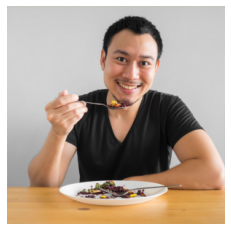

In [39]:
img = obtain_image(url="https://thecenterformindfuleating.org/resources/Pictures/asian%20man%20eating.jpg")
show_img(img)

a man with a blue shirt and a white shirt and a plate of food .
a man in a blue shirt and tie is holding a plate of food .
a man with a knife and a spoon up on a table .
a man with a tie and a spoon .
a man with a beard and a spoon up on a table .
a man in a white shirt is holding a plate of food .
a man in a white shirt and tie holding a plate of food .
a man with a beard and a spoon up to a plate of food .
a man in a blue shirt and tie is eating a plate .
a man in a blue shirt and tie with a spoon .


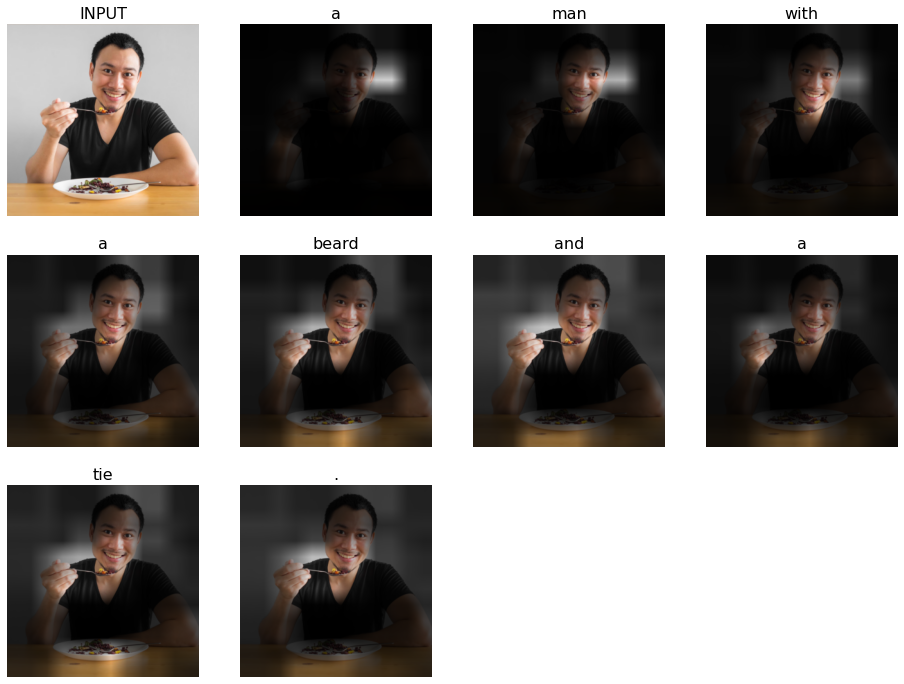

In [40]:
process_image(img)

a man riding a bike down a road with a mountain
a man riding a bike on a dirt road .
a man riding a bike down a road with a dog on the back .
a man riding a bike down a road with a dog in the background
a man riding a bike down a road .
a man riding a bike down a road next to a mountain .
a man riding a bicycle on a dirt road .
a person on a bicycle with a bike on the back of a road .
a man riding a bicycle on a path in the middle of a mountain .
a man riding a bicycle down a road with a mountain


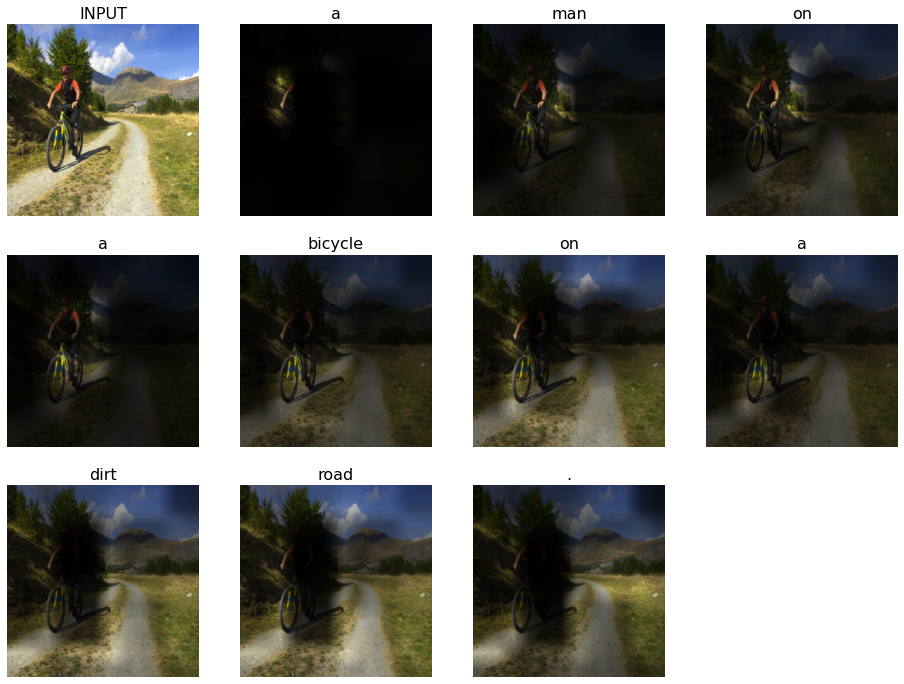

In [41]:
process_image(obtain_image(url="https://www.dimensioneattiva.it/wp-content/uploads/2016/10/Bike5.jpg"))

a cat laying on a couch with a cat on the back .
a cat sitting on a chair next to a cat .
a cat sitting on top of a couch .
a close up of a cat laying on a bed .
a cat is sitting on a couch with a cat .
a cat is sitting on a couch with a cat .
a cat laying on a couch with a cat
a cat is sitting on a couch with a cat .
a cat laying on top of a couch .
a cat is laying on a couch with a cat


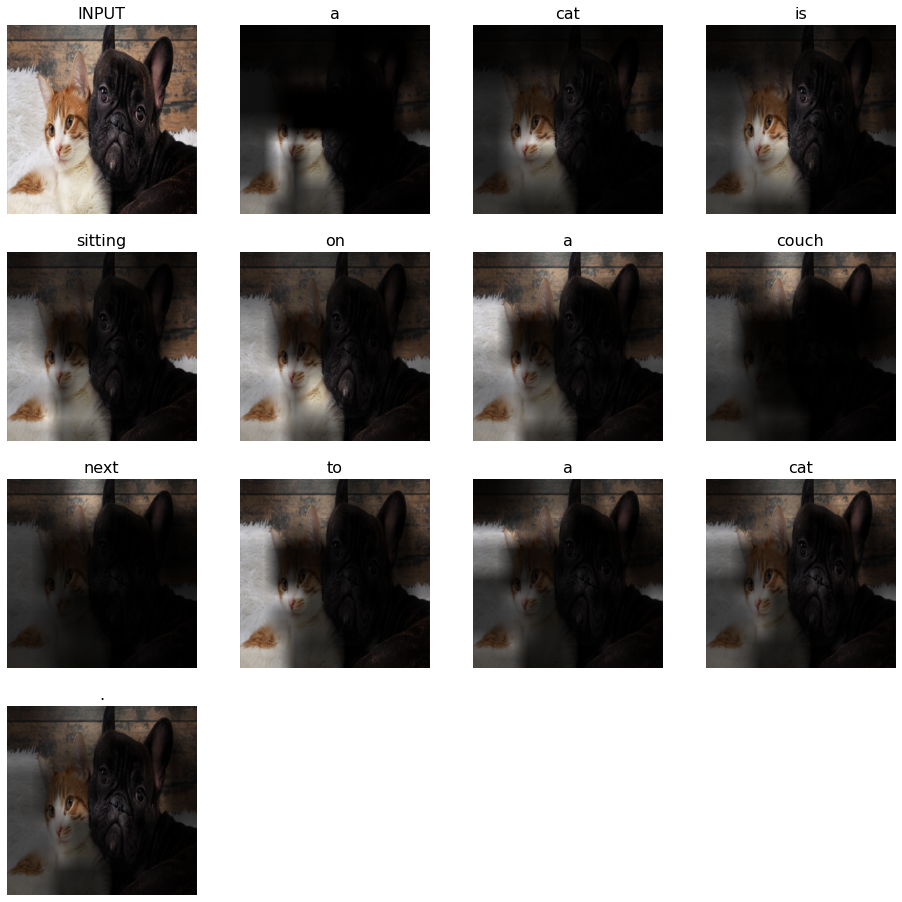

In [42]:
process_image(obtain_image(url="http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg"))

a man on a skateboard does a trick on a skateboard .
a man in a helmet is skateboarding on a ramp .
a man in a blue shirt is doing a trick on a skateboard .
a man on a skateboard does a trick on a skateboard .
a man is doing a trick on a skateboard .
a man in a red shirt is doing a trick on a skateboard .
a man is skateboarding on the side of a ramp .
a man in a red shirt is skateboarding on a skateboard .
a man is skateboarding on the back of a ramp .
a man in a helmet is riding a skateboard .


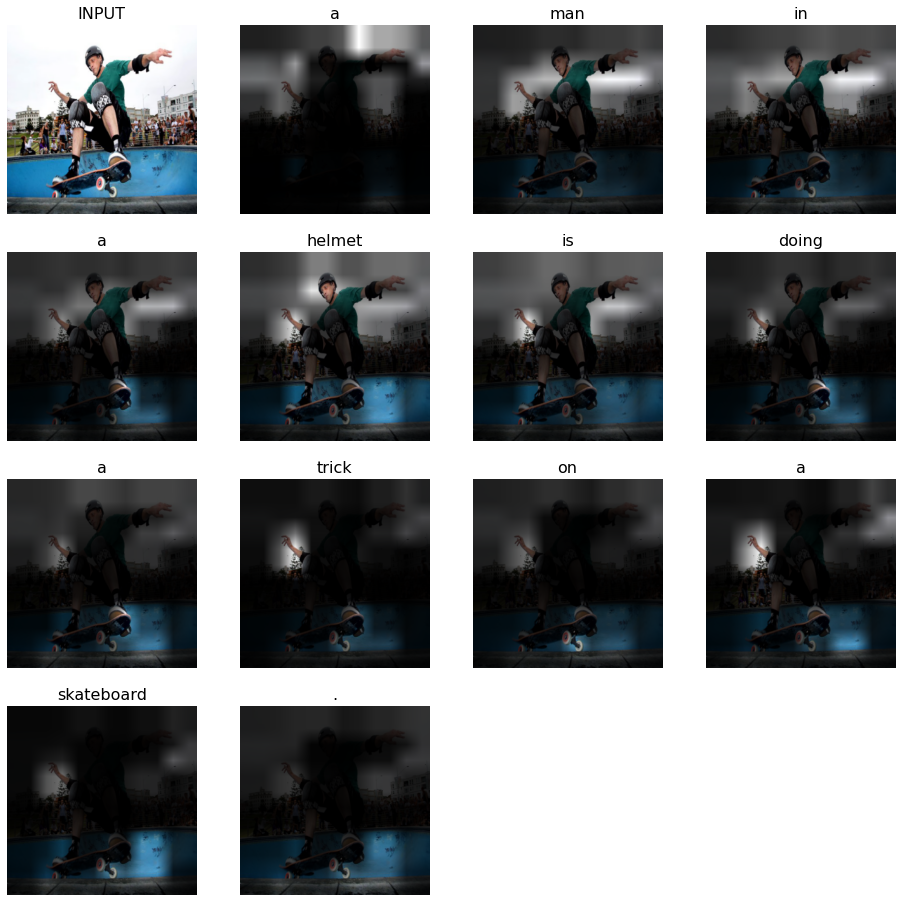

In [43]:
process_image(obtain_image(url="https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg"))

# Demo
### Find at least 10 images to test it on.
* Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
* Make sure it works okay on __simple__ images before going to something more comples
* Photos, not animation/3d/drawings, unless you want to train CNN network on anime
* Mind the aspect ratio

In [ ]:
#apply your network on image sample you found

a group of people standing next to each other in a room .
a group of men standing next to each other on a table .
a group of men standing next to each other in a room .
a group of people standing around a table with a cell phone .
a group of people standing next to each other in a room .
a group of people standing next to a woman holding a nintendo wii controller .
a group of people standing next to each other in a room .
a group of people standing next to each other in a kitchen .
a group of people standing next to each other in a room .
a group of people standing next to each other .


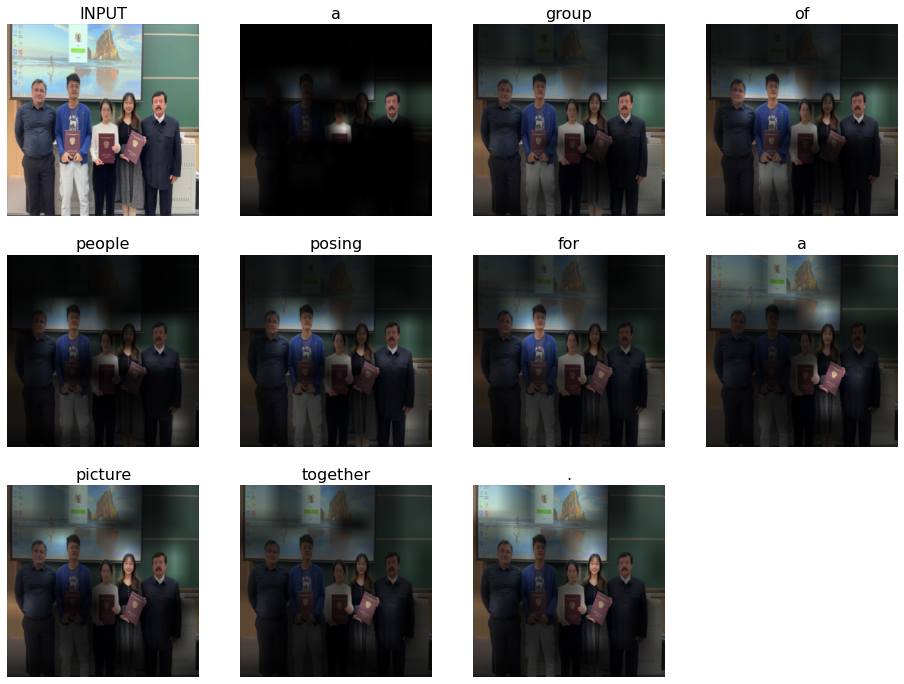

In [45]:
process_image(obtain_image(filename="/content/drive/MyDrive/Image2caption/pics_example/diploma.jpg"))

a statue of a statue on a statue of a statue .
a statue of a statue of a clock tower .
a statue of a statue on a street with a clock on the top .
a man standing on a sidewalk near a clock tower .
a statue of a statue of a statue on a statue .
a man flying a kite on the beach .
a statue of a clock tower with a clock on the top .
a statue of a statue of a statue on a statue
a statue of a clock tower with a clock on the top .
a man with a hat and a hat on a horse .


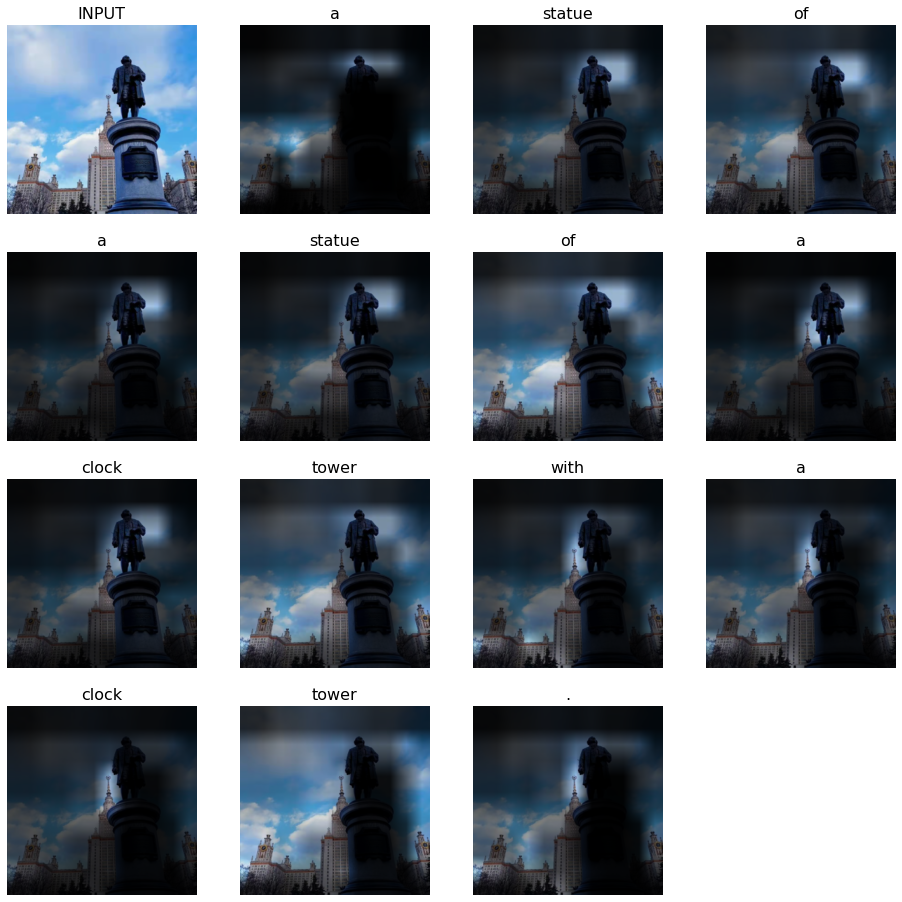

In [46]:
process_image(obtain_image(filename="/content/drive/MyDrive/Image2caption/pics_example/university.jpg"))

a dog laying on the grass with a dog in the grass .
a dog laying on a grass covered field .
a dog laying on a grass covered field .
a dog laying on a lush green field .
a dog laying on a grass covered field .
a dog laying on a lush green field .
a dog laying on a grass with a dog
a dog laying on the grass with a dog in the grass .
a dog laying on a grass field with a dog .
a dog laying on a grass covered field .


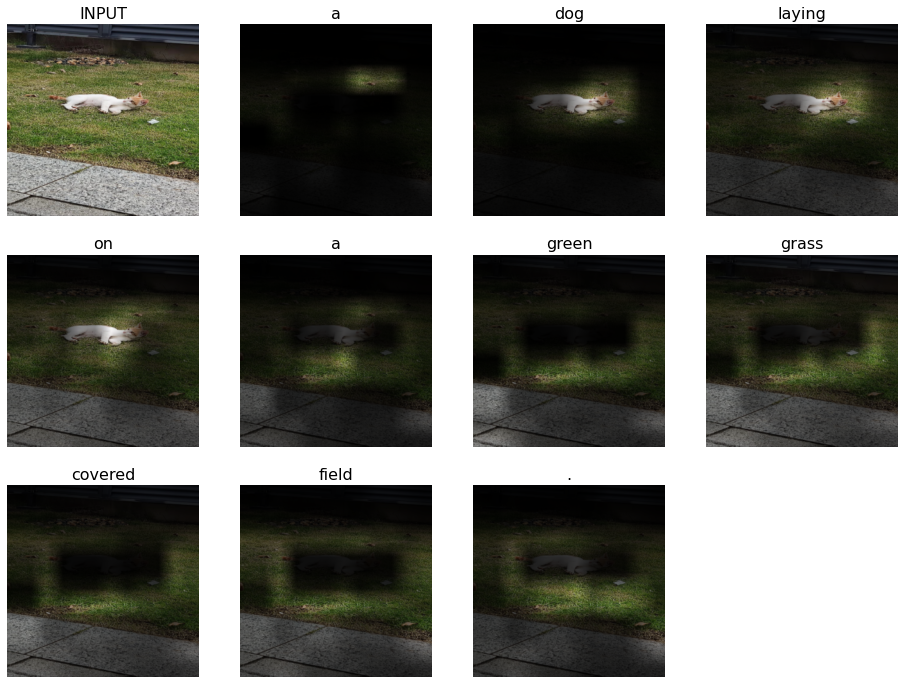

In [50]:
process_image(obtain_image(filename="/content/drive/MyDrive/Image2caption/pics_example/cat.jpg"))

a man with a microphone and a microphone .
a man holding a remote control in his mouth .
a man is holding a remote control in his mouth .
a man holding a remote control in his hand .
a man holding a remote control in his mouth .
a man holding a remote control in his mouth .
a man is sitting at a table with a remote control .
a man holding a remote control in his mouth .
a man with a remote control and a book .
a man holding a remote control in his mouth .


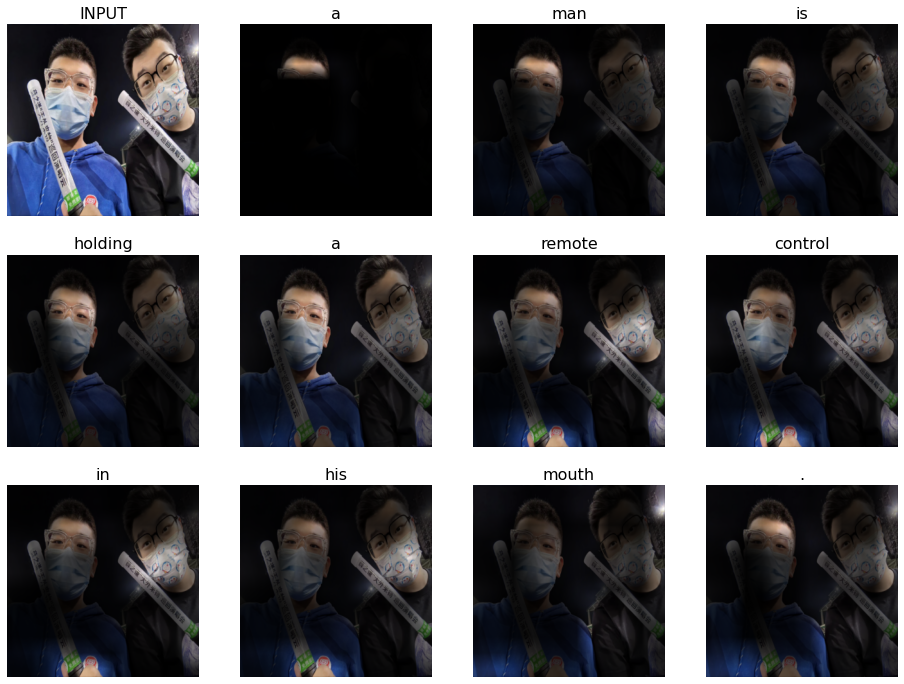

In [44]:
process_image(obtain_image(filename="/content/drive/MyDrive/Image2caption/pics_example/friends.jpg"))

a bed with a bed and a bed in it
a bed with a bed and a chair
a bed with a bed and a bed
a bed with a bed and a chair
a bed with a bed and a bed in it
a bed with a bed and a window
a bed with a chair and a bed
a bed with a large window and a bed
a bed with a bed and a bed in it .
a bed that is sitting in a room .


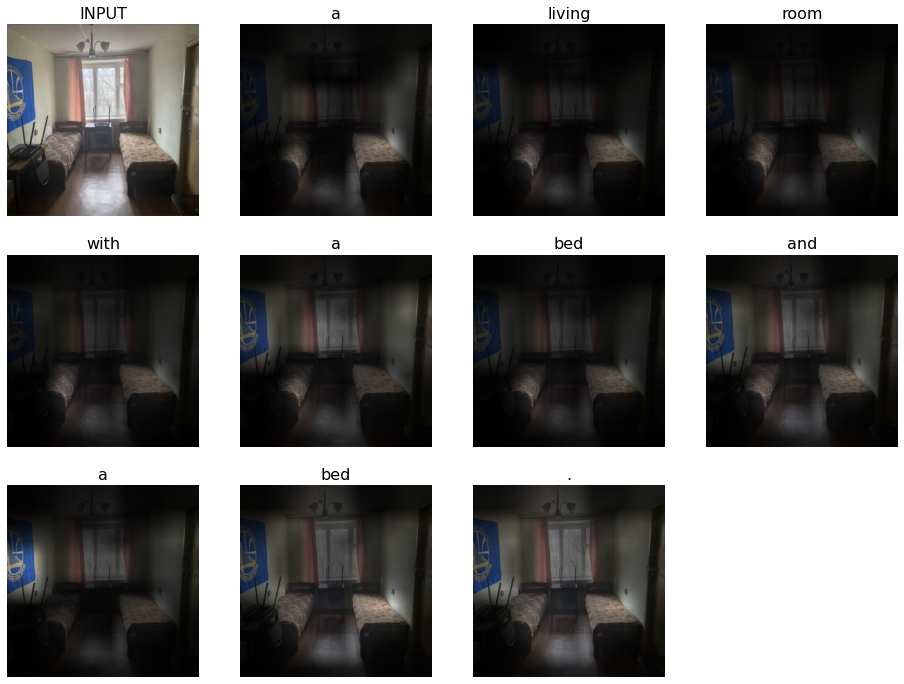

In [47]:
process_image(obtain_image(filename="/content/drive/MyDrive/Image2caption/pics_example/beds.jpg"))

a tennis player is standing on the court with a racket .
a tennis player is standing on the court .
a man is holding a tennis racquet on a tennis court .
a tennis player is standing on the court .
a tennis player is standing on the court .
a tennis player is standing on the court .
a man is standing on a tennis court holding a racquet .
a tennis player is standing on the court .
a man is playing tennis on a tennis court .
a person with a tennis racket on a tennis court .


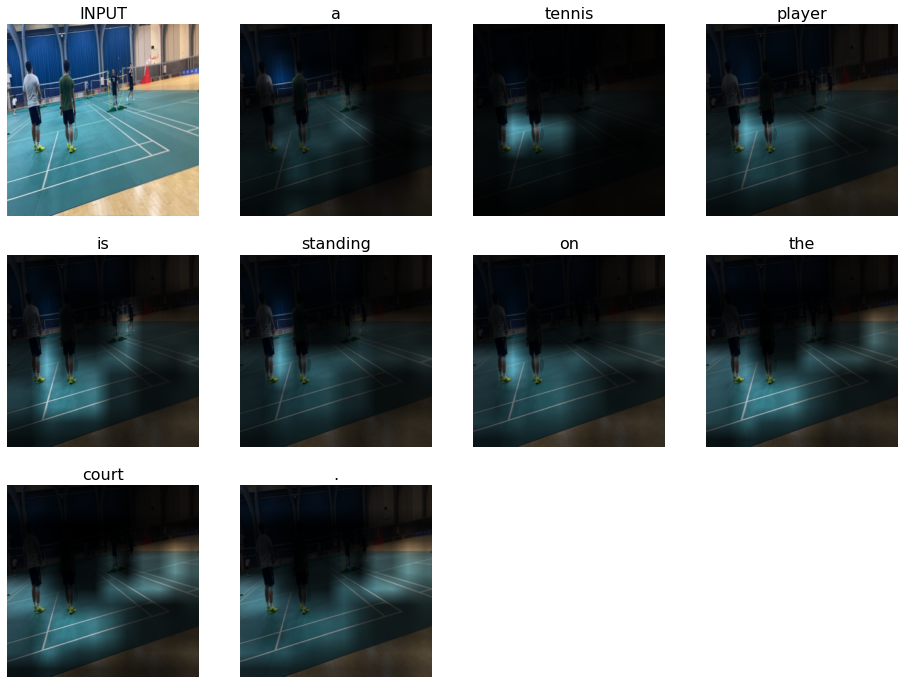

In [48]:
process_image(obtain_image(filename="/content/drive/MyDrive/Image2caption/pics_example/badminton.jpg"))

a table topped with a variety of food and vegetables .
a table topped with food and a plate of food .
a table topped with food and vegetables .
a bunch of food items displayed on a table .
a table topped with food and a fork .
a table topped with food and a table
a plate of food that is sitting on a table .
a table topped with food and a variety of food .
a table topped with different types of food .
a table topped with food and vegetables on a table .


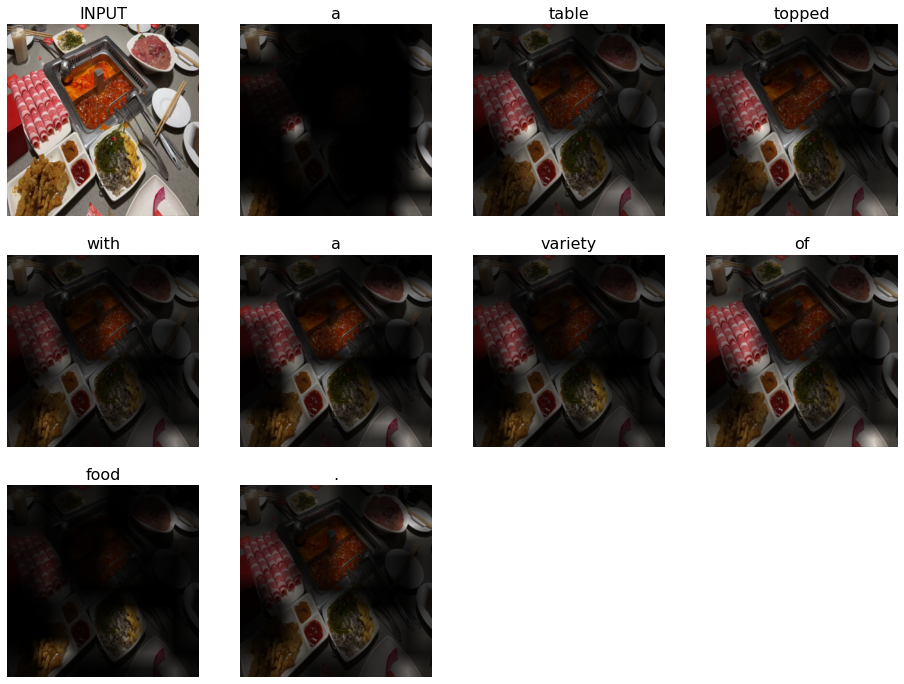

In [51]:
process_image(obtain_image(filename="/content/drive/MyDrive/Image2caption/pics_example/hotpot.jpg"))

a man is standing in the air with a skateboard .
a group of people standing around a building .
a man in a red shirt is doing a trick on a skateboard .
a man is skateboarding in the air with a racket
a man is doing a trick on a skateboard .
a group of people are playing a game of tennis .
a man is doing a trick on a skateboard .
a group of people standing around a building .
a group of people standing around a building with a skateboard .
a group of people are playing a game of baseball .


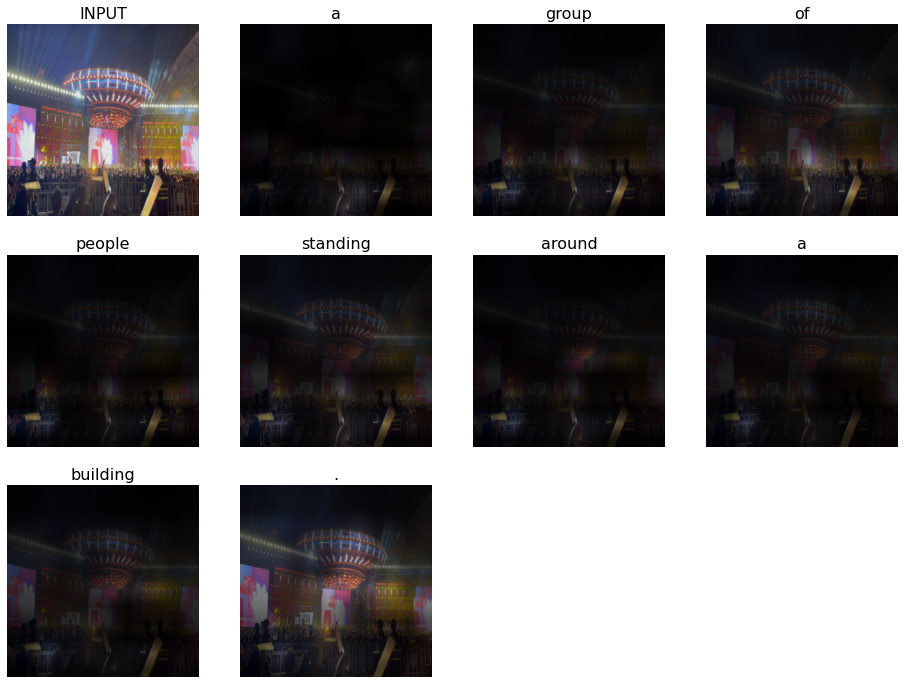

In [52]:
process_image(obtain_image(filename="/content/drive/MyDrive/Image2caption/pics_example/show.jpg"))

a train on a city street with a bridge .
a clock tower with a clock on the side of it .
a view of a city street with a clock on the side .
a view of a city street with a clock on the side of it .
a view of a city street with a clock on the side .
a view of a city street with a clock on the side .
a large clock tower on the side of a city street .
a picture of a train on a city street .
a view of a city street with a clock on the side of it .
a view of a city street with a clock on it .


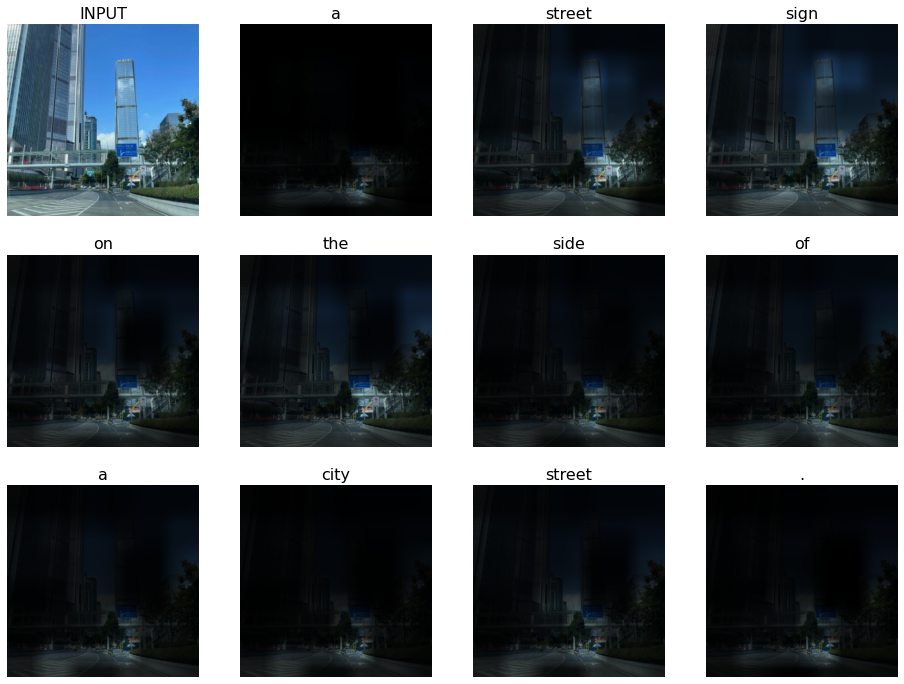

In [53]:
process_image(obtain_image(filename="/content/drive/MyDrive/Image2caption/pics_example/city.jpg"))

a close up of a person with a frisbee .
a close up of a small bird on a plate
a close up of a close up of a person on a skateboard
a close up of a person with a frisbee in the background
a close up of a small bird on a plate
a close up of a person in a park
a close up of a person with a frisbee in the background .
a close up of a person holding a frisbee .
a close up of a person on a skateboard
a close up of a person with a frisbee


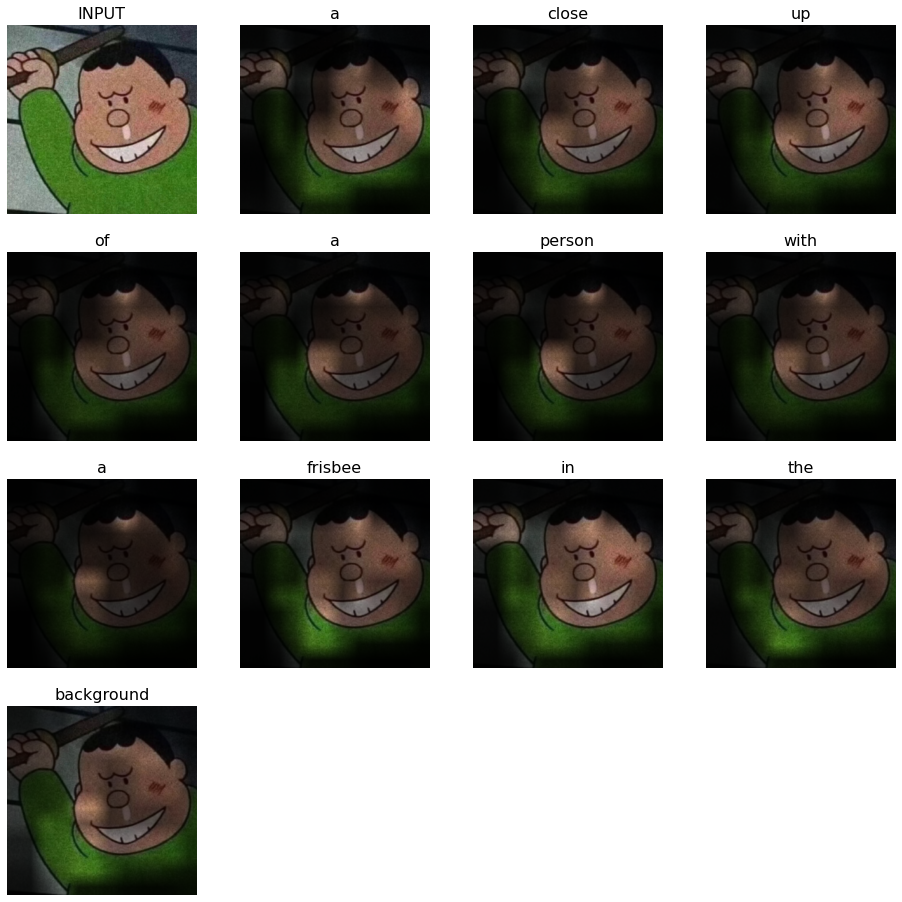

In [49]:
process_image(obtain_image(filename="/content/drive/MyDrive/Image2caption/pics_example/bighead.jpg"))

### Conclusion
Here is a place for your conclusions, observations, hypotheses, and any other feedback.

- The training process at about num_epoches = 32 has decrease not quite rapid -> almost constant.
- I used cross-entropy loss as loss function
- Author of this notebook had reached loss=3.1 with num_epoches = 128 

### Now what?

Your model produces some captions but you still strive to improve it? You're damn right to do so. Here are some ideas that go beyond simply "stacking more layers". The options are listed easiest to hardest.

##### Attention
You can build better and more interpretable captioning model with attention over the generated part of the sentense.

##### Subword level captioning
In the base version, we replace all rare words with UNKs which throws away a lot of information and reduces quality. A better way to deal with vocabulary size problem would be to use Byte-Pair Encoding

* BPE implementation you can use: [github_repo](https://github.com/rsennrich/subword-nmt). 
* Theory: https://arxiv.org/abs/1508.07909
* It was originally built for machine translation, but it should work with captioning just as well.

#### Reinforcement learning
* After your model has been pre-trained in a teacher forced way, you can tune for captioning-speific models like CIDEr.
* Tutorial on RL for sequence models: [practical_rl week8](https://github.com/yandexdataschool/Practical_RL/tree/master/week8_scst)
* Theory: https://arxiv.org/abs/1612.00563